# Loading Libraries

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import folium
%matplotlib inline

# Reading and Cleaning Data

In [22]:
school_district = pd.read_csv("school_district_2014-15.csv")
school_district.head()

,YEAR,DISTCD,STATNAME,DISTNAME,TOTPOPULAT,POPULATION_0_6,SEXRATIO,P_SC_POP,P_ST_POP,OVERALL_LI,...,FTCHTOT,TCHMTOT,ENRGTOT,PPFTCH,PPMTCH,PMTCH,PFTCH,TCHSTFTOT,TCHOBCMTOT,TCHOBCFTOT
0,2014-15,101,JAMMU & KASHMIR,KUPWARA,875564.0,197001.90,843.0,0.12,8.08,66.92,...,2355,6919,61527,189,449,1710,540,69,1315,338
1,2014-15,102,JAMMU & KASHMIR,BARAMULA,1015503.0,161871.18,873.0,0.15,3.74,66.93,...,4638,7545,90252,1381,1702,2145,1671,57,1291,459
2,2014-15,103,JAMMU & KASHMIR,SRINAGAR,1269751.0,155798.45,879.0,0.09,0.72,71.21,...,7835,2422,62136,1993,547,1551,5587,35,45,25
3,2014-15,104,JAMMU & KASHMIR,BADGAM,735753.0,150755.79,883.0,0.05,3.17,57.98,...,2917,5199,45873,560,694,1509,1258,38,927,228
4,2014-15,105,JAMMU & KASHMIR,PULWAMA,570060.0,97651.28,913.0,0.07,4.03,65.00,...,2085,3883,29967,563,640,1452,1019,17,367,76


In [23]:
school_district.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 680 entries, 0 to 679
Data columns (total 52 columns):
YEAR              680 non-null object
DISTCD            680 non-null int64
STATNAME          680 non-null object
DISTNAME          680 non-null object
TOTPOPULAT        635 non-null float64
POPULATION_0_6    634 non-null float64
SEXRATIO          635 non-null float64
P_SC_POP          633 non-null float64
P_ST_POP          633 non-null float64
OVERALL_LI        635 non-null float64
FEMALE_LIT        638 non-null float64
MALE_LIT          639 non-null float64
AREA_SQKM         661 non-null float64
SCHTOT            680 non-null int64
SCHTOTG           680 non-null int64
SCHTOTP           680 non-null int64
SCHTOTM           680 non-null int64
SCHTOTGR          680 non-null int64
SCHTOTGA          680 non-null int64
SCHTOTPR          680 non-null int64
SCHBOYTOT         680 non-null int64
SCHGIRTOT         680 non-null int64
ENRTOT            680 non-null int64
ENRTOTG           680 n

In [24]:
#handling missing values as the districts are arranged by states interpolation should be suitable for this analysis.
school_district.interpolate(inplace=True)

In [25]:
#school_district.drop(["TOT_6_10_15","TOT_11_13_15","P_URB_POP"], axis=1, inplace=True)
school_district.dropna(axis=0, inplace=True)
school_district.columns = map(str.lower, school_district.columns)
print(school_district.columns)

Index(['year', 'distcd', 'statname', 'distname', 'totpopulat',
       'population_0_6', 'sexratio', 'p_sc_pop', 'p_st_pop', 'overall_li',
       'female_lit', 'male_lit', 'area_sqkm', 'schtot', 'schtotg', 'schtotp',
       'schtotm', 'schtotgr', 'schtotga', 'schtotpr', 'schboytot', 'schgirtot',
       'enrtot', 'enrtotg', 'enrtotp', 'enrtotm', 'enrtotgr', 'enrtotpr',
       'tchtotg', 'tchtotp', 'tchtotm', 'sclstot', 'stchtot', 'roadtot',
       'sgtoiltot', 'sbtoiltot', 'swattot', 'seletot', 'scomptot', 'estdtot',
       'mdmtot', 'tchtot', 'ftchtot', 'tchmtot', 'enrgtot', 'ppftch', 'ppmtch',
       'pmtch', 'pftch', 'tchstftot', 'tchobcmtot', 'tchobcftot'],
      dtype='object')


In [26]:
school_district.drop(["ppftch","ppmtch","pmtch","pftch","tchstftot","tchobcmtot","tchobcftot"], axis=1, inplace=True)

# Changing columns values to percentage for easier analysis

In [27]:
p_school_district = school_district[["sexratio","p_sc_pop","p_st_pop","overall_li","female_lit","male_lit","distname","statname"]]

#precentage of govt, private schools in a district
p_school_district["p_schtotg"] = (school_district["schtotg"] / school_district["schtot"])*100
p_school_district["p_schtotp"] = (school_district["schtotp"] / school_district["schtot"])*100
p_school_district["p_schtotm"] = (school_district["schtotm"] / school_district["schtot"])*100

#percentage of govt, govt aided and private schools in rural areas
p_school_district["p_schtotgr"] = (school_district["schtotgr"] / (school_district["schtotgr"] + school_district["schtotga"] + school_district["schtotpr"]))*100
p_school_district["p_schtotga"] = (school_district["schtotga"] / (school_district["schtotgr"] + school_district["schtotga"] + school_district["schtotpr"]))*100
p_school_district["p_schtotpr"] = (school_district["schtotpr"] / (school_district["schtotgr"] + school_district["schtotga"] + school_district["schtotpr"]))*100

#percentage of boys only school and girls only school
p_school_district["p_schboytot"] = (school_district["schboytot"] / school_district["schtot"]) * 100
p_school_district["p_schgirtot"] = (school_district["schgirtot"] / school_district["schtot"]) * 100

#percentage enrollment in govt and private school
p_school_district["p_enrtotg"] = (school_district["enrtotg"] / school_district["enrtot"]) * 100
p_school_district["p_enrtotp"] = (school_district["enrtotp"] / school_district["enrtot"]) * 100
p_school_district["p_enrtotm"] = (school_district["enrtotm"] / school_district["enrtot"]) * 100

#percentage enrollment by girls in schools
p_school_district["p_enrgtot"] = (school_district["enrgtot"] / school_district["enrtot"]) * 100

#percentage enrollment in govt and private school in rural areas
p_school_district["p_enrtotgr"] = (school_district["enrtotgr"] / (school_district["enrtotgr"] + school_district["enrtotpr"])) * 100
p_school_district["p_enrtotpr"] = (school_district["enrtotpr"] / (school_district["enrtotgr"] + school_district["enrtotpr"])) * 100

#percentage of govt, private and madrasas teachers
p_school_district["p_tchtotg"] = (school_district["tchtotg"] / school_district["tchtot"]) * 100
p_school_district["p_tchtotp"] = (school_district["tchtotp"] / school_district["tchtot"]) * 100
p_school_district["p_tchtotm"] = (school_district["tchtotm"] / school_district["tchtot"]) * 100

#percentage of single classrooms and single teachers schools
p_school_district["p_sclstot"] = (school_district["sclstot"] / school_district["schtot"]) * 100
p_school_district["p_stchtot"] = (school_district["stchtot"] / school_district["schtot"]) * 100

#percentage of school approachable by all weather roads
p_school_district["p_roadtot"] = (school_district["roadtot"] / school_district["schtot"]) * 100

#percentage of school with girls toilet and boys toilet
p_school_district["p_sgtoiltot"] = (school_district["sgtoiltot"] / school_district["schtot"]) * 100
p_school_district["p_sbtoiltot"] = (school_district["sbtoiltot"] / school_district["schtot"]) * 100

#percentage of school with water, electricity, computer
p_school_district["p_swattot"] = (school_district["swattot"] / school_district["schtot"]) * 100
p_school_district["p_seletot"] = (school_district["seletot"] / school_district["schtot"]) * 100
p_school_district["p_scomptot"] = (school_district["scomptot"] / school_district["schtot"]) * 100

#percentage of schools established since 2001
p_school_district["p_estdtot"] = (school_district["estdtot"] / school_district["schtot"]) * 100

#percentage of schools providing mid day meals
p_school_district["p_mdmtot"] = (school_district["mdmtot"] / school_district["schtot"]) * 100

#percentage of females and males teachers
p_school_district["p_ftchtot"] = (school_district["ftchtot"] / school_district["tchtot"]) * 100
p_school_district["p_tchmtot"] = (school_district["tchmtot"] / school_district["tchtot"]) * 100



C:\Users\epfo\Anaconda3\lib\site-packages\ipykernel\__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\epfo\Anaconda3\lib\site-packages\ipykernel\__main__.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\epfo\Anaconda3\lib\site-packages\ipykernel\__main__.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-vie

In [28]:
p_school_district.describe()

C:\Users\epfo\Anaconda3\lib\site-packages\numpy\lib\function_base.py:3834: RuntimeWarning: Invalid value encountered in percentile
  RuntimeWarning)


,sexratio,p_sc_pop,p_st_pop,overall_li,female_lit,male_lit,p_schtotg,p_schtotp,p_schtotm,p_schtotgr,...,p_roadtot,p_sgtoiltot,p_sbtoiltot,p_swattot,p_seletot,p_scomptot,p_estdtot,p_mdmtot,p_ftchtot,p_tchmtot
count,680.000000,680.000000,680.000000,680.000000,680.000000,680.000000,680.000000,680.000000,680.000000,680.000000,...,680.000000,680.000000,680.000000,680.000000,680.000000,680.000000,680.000000,680.000000,680.000000,680.000000
mean,943.369118,14.536956,18.987096,72.866147,64.138382,81.057037,75.352673,22.410563,2.236764,41.110785,...,88.104736,87.009264,93.166520,95.054780,56.822125,29.877146,28.158518,77.901080,45.837405,53.754931
std,61.763147,9.147270,27.449524,10.339922,12.667239,8.972776,15.068110,15.072144,4.037385,8.789958,...,14.226152,16.106807,8.961902,8.981025,33.718059,24.527749,12.630500,12.839362,15.596073,15.446666
min,533.000000,0.000000,0.000000,37.220000,30.970000,43.600000,1.229508,0.000000,0.000000,0.000000,...,5.138340,24.812232,35.684647,26.502146,5.222552,3.054807,1.581028,0.000000,16.432740,11.964036
25%,905.000000,7.105000,0.467500,66.052500,55.147500,75.795000,67.538149,11.150502,0.000000,39.537275,...,84.232378,80.015353,92.249552,94.310022,24.113777,10.183019,18.120526,70.615066,34.352426,44.784336
50%,947.000000,15.270000,4.845000,73.235000,63.615000,82.460000,78.232934,19.842460,0.566680,43.511888,...,93.152504,95.088914,96.667243,98.646027,51.876072,20.979894,26.831418,80.965321,42.245762,57.099568
75%,981.000000,20.745000,26.875000,80.445000,73.155000,87.427500,86.485079,31.278322,2.569990,46.251979,...,97.716059,98.674946,98.400469,99.926211,96.433807,43.217616,37.094447,87.143525,55.213095,64.844432
max,1176.000000,50.170000,98.580000,98.760000,98.280000,99.240000,100.000000,98.770492,49.570815,50.000000,...,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,69.451074,97.826087,87.891384,83.567260


In [29]:
corelations = school_district.corr()
corelations["overall_li"]

distcd            0.176169
totpopulat        0.080576
population_0_6   -0.099236
sexratio          0.109320
p_sc_pop          0.040511
p_st_pop         -0.184520
overall_li        1.000000
female_lit        0.975177
male_lit          0.946410
area_sqkm        -0.130458
schtot           -0.152977
schtotg          -0.252582
schtotp           0.130558
schtotm          -0.037605
schtotgr         -0.291846
schtotga         -0.197829
schtotpr          0.040356
schboytot        -0.154957
schgirtot        -0.154934
enrtot           -0.055378
enrtotg          -0.236257
enrtotp           0.212904
enrtotm          -0.103624
enrtotgr         -0.311524
enrtotpr          0.072960
tchtotg          -0.041858
tchtotp           0.297519
tchtotm           0.020067
sclstot          -0.103029
stchtot          -0.353270
roadtot          -0.099361
sgtoiltot        -0.075852
sbtoiltot        -0.119014
swattot          -0.134079
seletot           0.145712
scomptot          0.293944
estdtot          -0.327969
m

# Visualization Function 
We will be visualising the following comparison
1. Female Literacy and Male Literacy
2. Sex Ratio
3. Percentage of Govt Schools, Private Schools and Schools Established after 2001
4. Percentage of Enrollment in Govt Schools and Private Schools.
5. Percentage Enrollment in Rural Areas in Govt and Private Schools.
6. Teachers in Govt and Private
7. Male and Female Teachers
8. Schools with Girls toilet, Boys Toilet and Availability of Water
9. Schools with Electricity, Computer, Mid-day Meal

In [30]:
def visual(df):
    #female literacy and Male literacy
    df[["female_lit","male_lit"]].plot(kind="bar", alpha=0.7)
    plt.xlabel("Female Literacy and Male Literacy")
    plt.legend(["Female Literacy", "Male Literacy"])
    
    plt.show()
    #Sex ratio
    df[["sexratio"]].plot(kind="bar", alpha=0.7)
    plt.xlabel("Sex Ratio")
    plt.legend(["Sex Ratio"])
    plt.show()
    #percentage of govt, private schools, schools established after 2001
    df[["p_schtotg","p_schtotp","p_estdtot"]].plot(kind="bar", alpha=0.7)
    plt.xlabel("Govt Schools, Private Schools, Schools Estd. after 2001")
    plt.legend(["Govt Schools","Private Schools","Schools Estd after 2001"])
    plt.show()
    
    #enrollment in govt and private schools and enrollment of girls 
    df[["p_enrtotg","p_enrtotp","p_enrgtot"]].plot(kind="bar", alpha=0.7)
    plt.xlabel("Enrollment in Govt, Private Schools and Enrollment of Girls")
    plt.legend(["Enrollment in Govt. Schools","Enrollment in Private Schools","Enrollment of Girls"])
    plt.show()
    #enrolment in rural areas govt and private schools 
    df[["p_enrtotgr","p_enrtotpr"]].plot(kind="bar", alpha=0.7)
    plt.xlabel("Enrollment in Govt and Private Schools in Rural Areas")
    plt.legend(["Enrollment in Govt Schools in Rural Areas","Enrollment in Private Schools in Rural Areas"])
    plt.show()
    #Teachers percentage in govt and private
    df[["p_tchtotg","p_tchtotp"]].plot(kind="bar", alpha=0.7)
    plt.xlabel("Percentage of Teachers in Govt and Private Schools")
    plt.legend(["Teachers in Govt. Schools","Teachers in Private Schools"])
    plt.show()

    #Female and male teachers 
    df[["p_ftchtot","p_tchmtot"]].plot(kind="bar", alpha=0.7)
    plt.xlabel("Percentage of Male and Female Teachers")
    plt.legend(["Male Teachers","Female Teachers"])
    plt.show()

    #percentage of single classroom school and single teacher school
    df[["p_sclstot","p_stchtot"]].plot(kind="bar", alpha=0.7)
    plt.xlabel("Percentage of Single Classroom School and Single Teacher School")
    plt.legend(["Single Classroom School","Single Teacher School"])
    plt.show()

    #percentage of schools with girls and boys toilet and avaiilability of water
    df[["p_sgtoiltot","p_sbtoiltot","p_swattot"]].plot(kind="bar", alpha=0.7)
    plt.xlabel("Percentage of Schools with Girls Toilet, Boys Toilet, Availability of Water")
    plt.legend(["Schools with Girls Toilet","Schools with Boys Toilet","Availability of Water in Schools"])
    plt.show()

    #percentage of schools with electricity, computer, mid-day meal
    df[["p_seletot","p_scomptot","p_mdmtot"]].plot(kind="bar", alpha=0.7)
    plt.xlabel("Percentage of Schools with Electricity, Computer, Mid Day Meal")
    plt.legend(["Electricity","Computer","Mid Day Meal"])
    plt.show()


# Top Ten Districts as per literacy rate

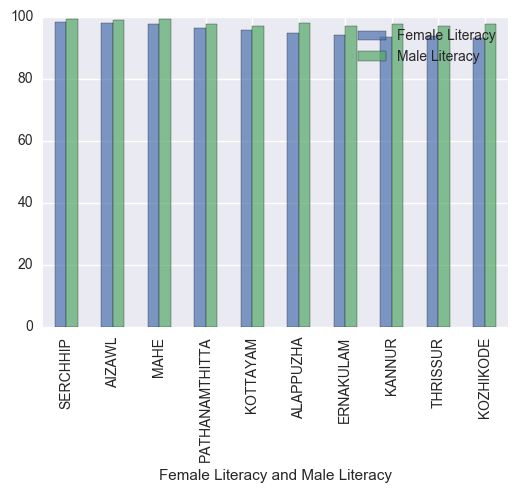

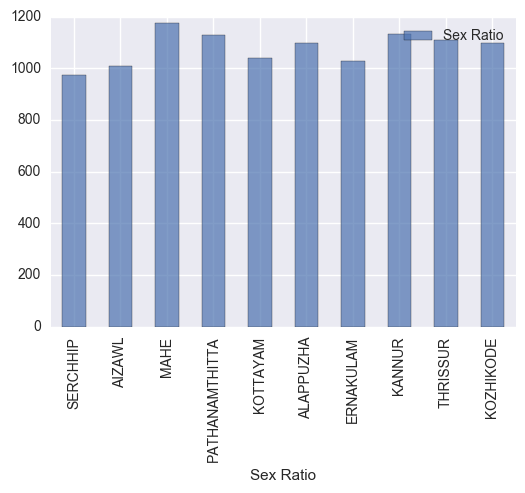

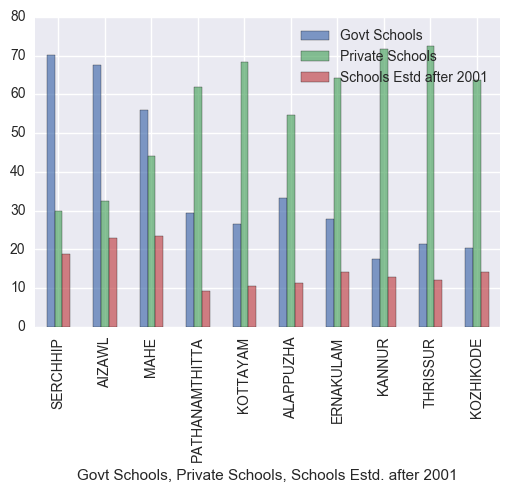

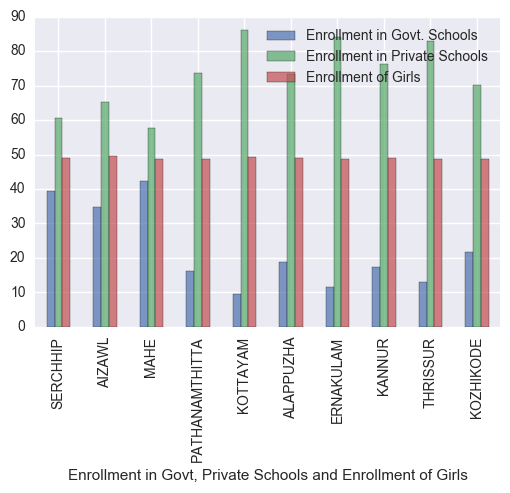

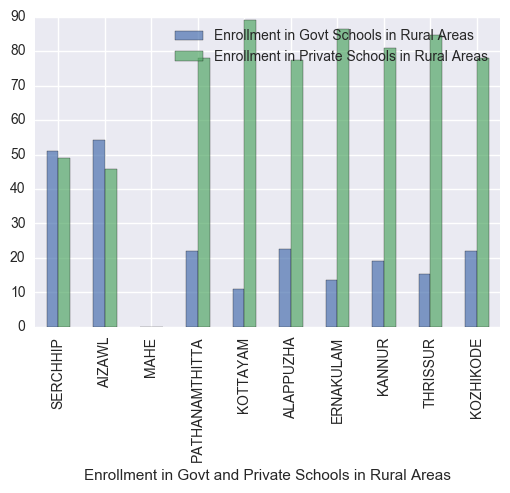

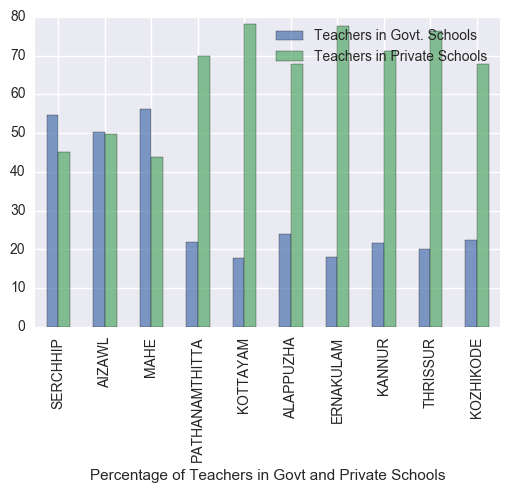

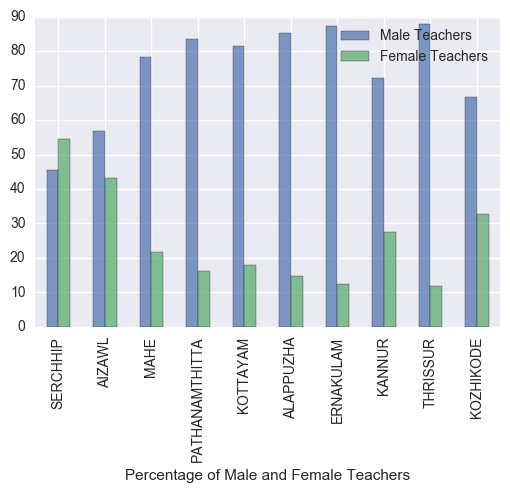

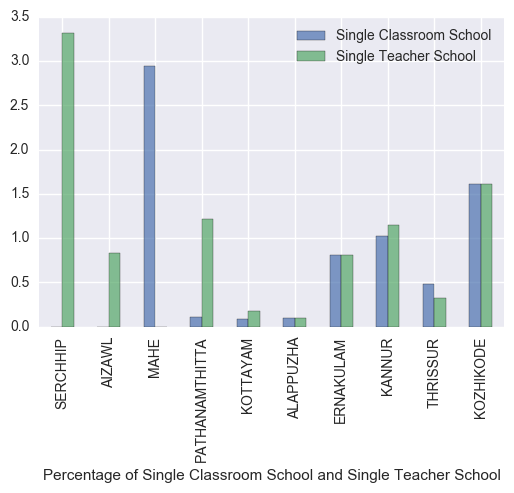

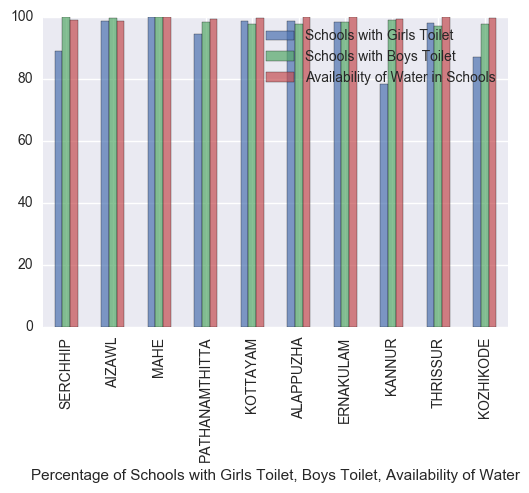

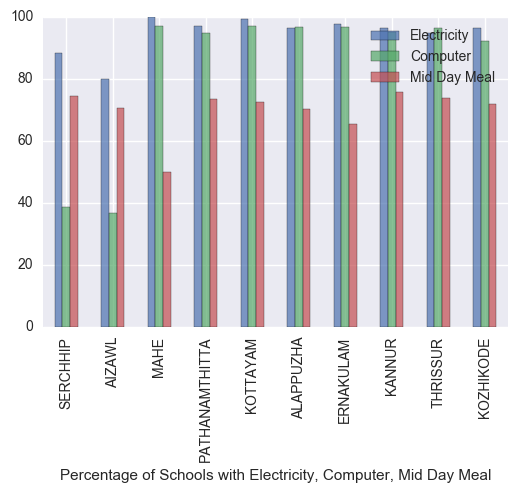

In [31]:
top_ten_district = p_school_district.sort_values(by="overall_li", ascending=False).set_index("distname").iloc[0:10]
visual(top_ten_district)

In [32]:
top_ten_district["statname"].value_counts()

KERALA        7
MIZORAM       2
PUDUCHERRY    1
Name: statname, dtype: int64

# Summary of Top Ten Districts

Kerala has 7 districts in top ten while Mizoram has 2 and Puducherry has 1. All districts has sex ratio near about 1000. Except Serchhip, Aizwal, Mahe the number of private schools exceed the number of govt schools. Enrollment in private schools exceeds enrollment in govt schools for all ten districts. This behaviour is same in rural areas too. This was to be expected as increasingly the education is under private management rather the govt since the Liberalisation reform in 1991. Enrollment in rural areas for Mahe is zero as Mahe is the smallest district of India with an area of 9 km square, hence the categorization of rural and urban wont be applicable to Mahe. No of teachers in govt schools and private schools follows a behaviour similar to no of govt schools and private schools in a district. Percentage of Male teachers exceeds percentage of Female Teachers for all districts except Aizwal and Serchhip which are near about equal in both case. This can be attributed to the fact that in state of Mizoram, which are matrilinear society, the position of women is as equal to men. Percentage of single classroom school and single teachers schools are less than 3% for all ten districts. Access to toilet and water for students is above 90 percent. Access to computer is below 40 percent of the two districts of Mizoram. More than 60 percent schools have access to mid day meals.



# Top Ten States by Literacy Rate

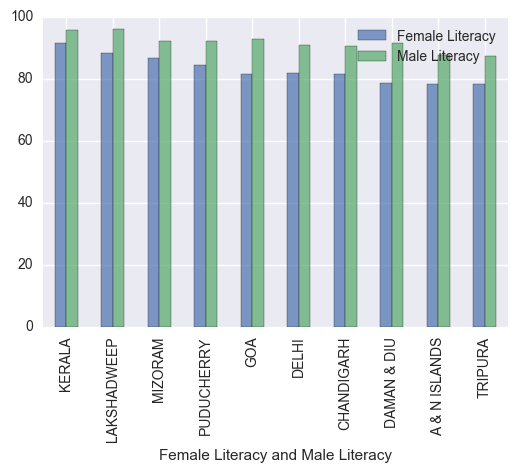

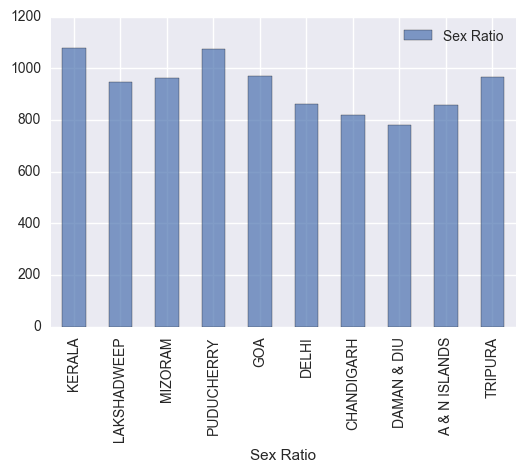

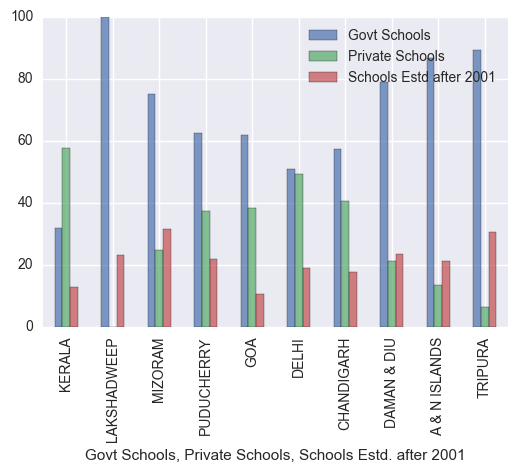

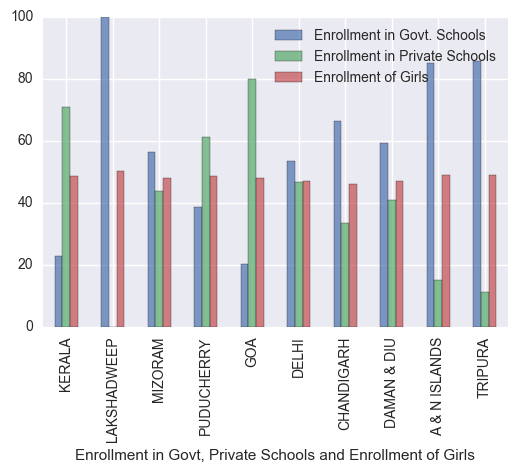

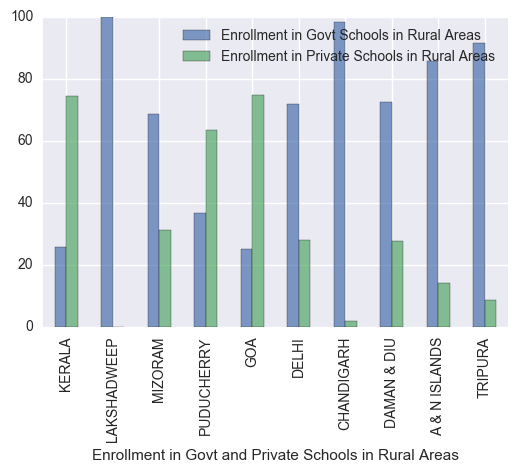

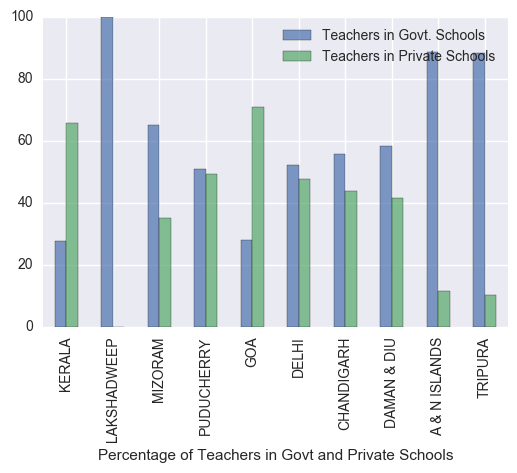

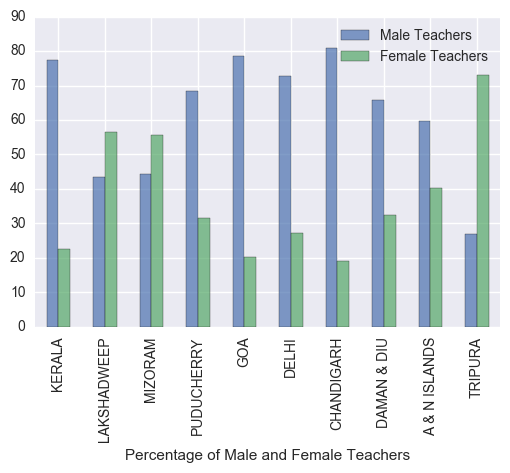

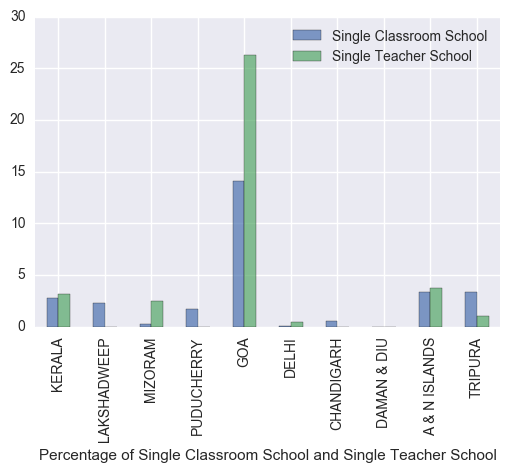

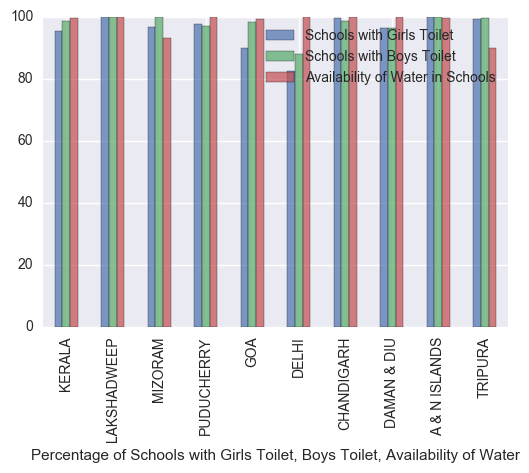

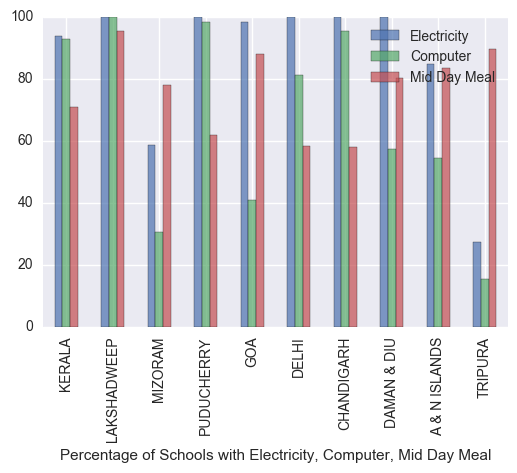

In [33]:
p_school_states = p_school_district.groupby("statname").mean()
p_school_states_ten = p_school_states.sort_values(by="overall_li", ascending=False).iloc[0:10]
visual(p_school_states_ten)

# Bottom Ten States by Literacy Rate

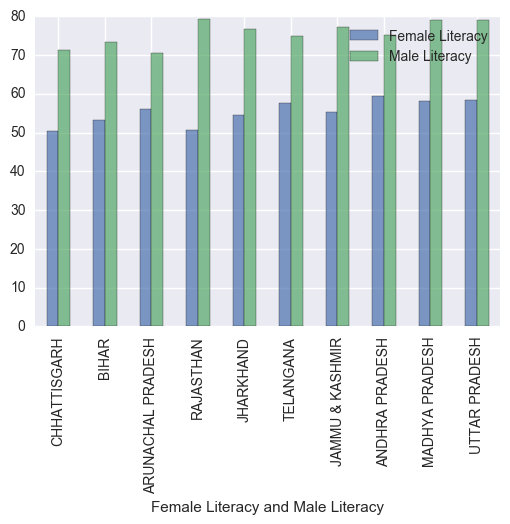

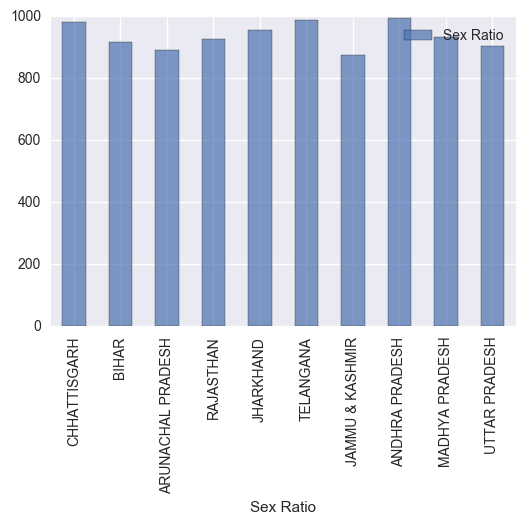

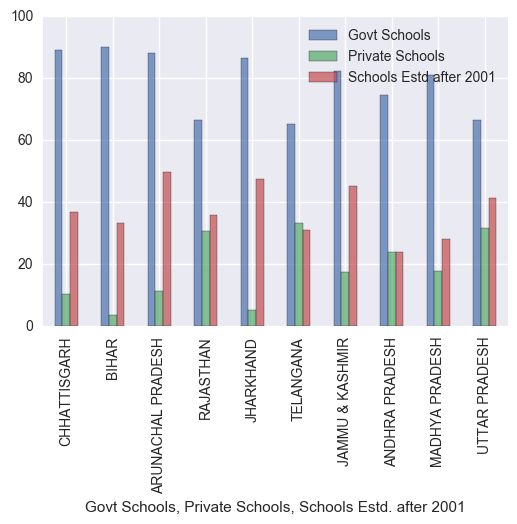

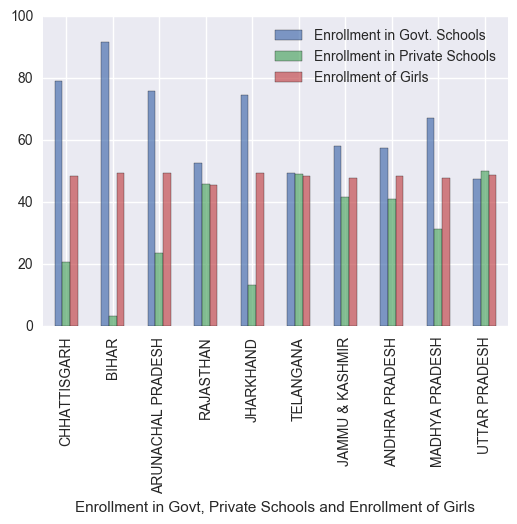

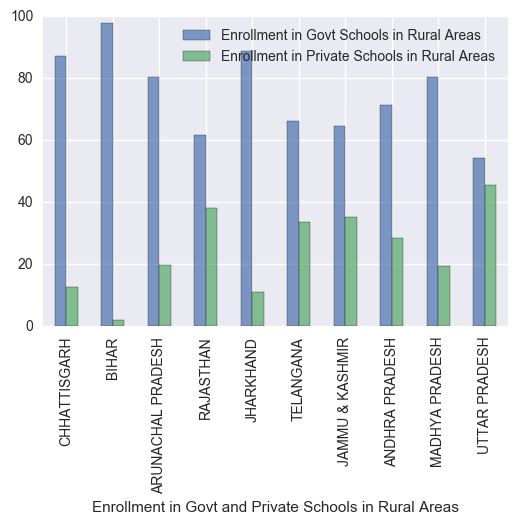

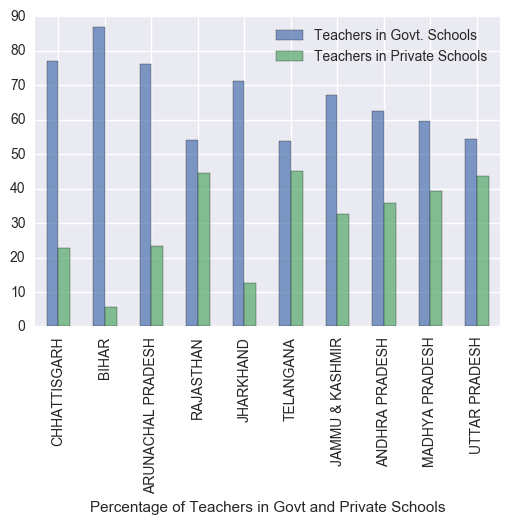

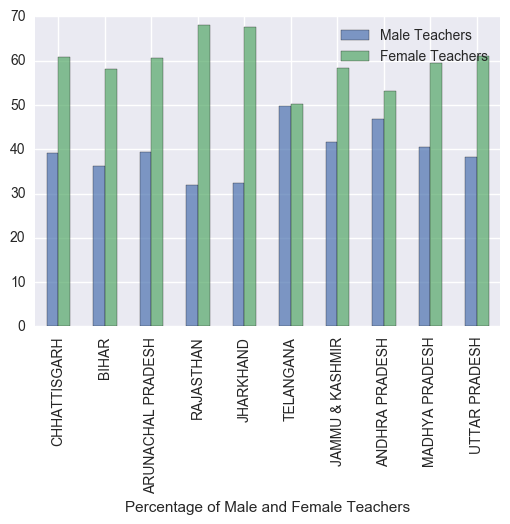

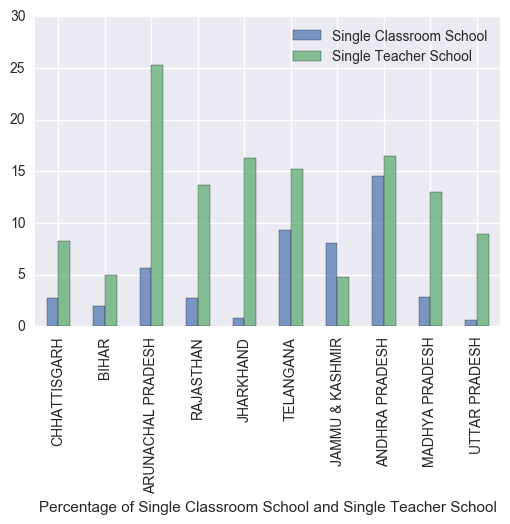

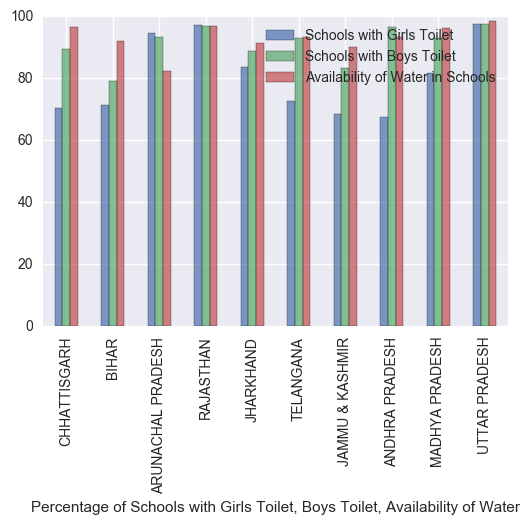

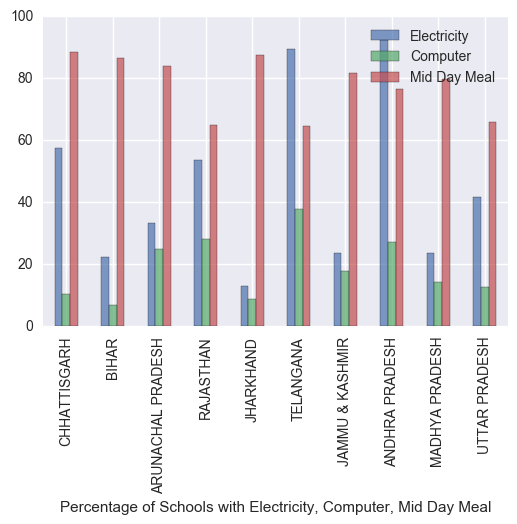

In [34]:
p_school_states_ten_bottom = p_school_states.sort_values(by="overall_li", ascending=True).iloc[0:10]
visual(p_school_states_ten_bottom)

# Bottom Ten District by Literacy Rate

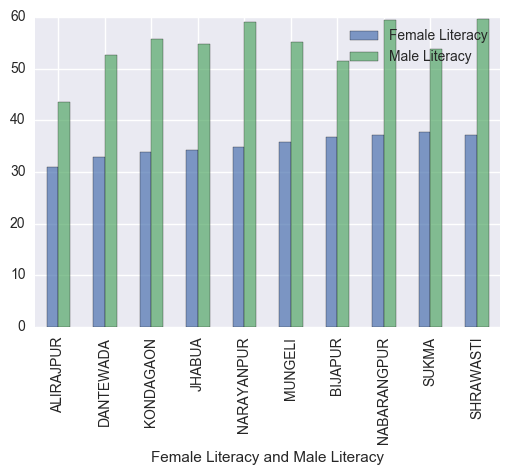

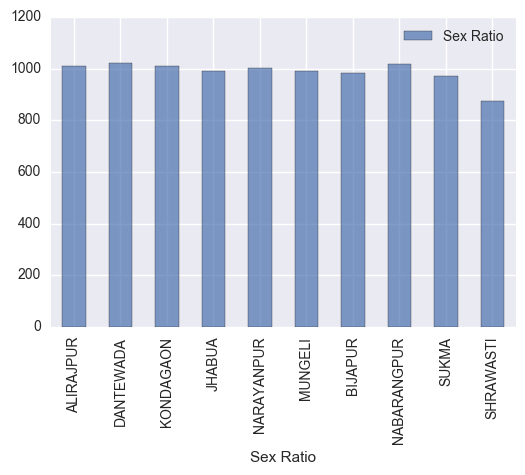

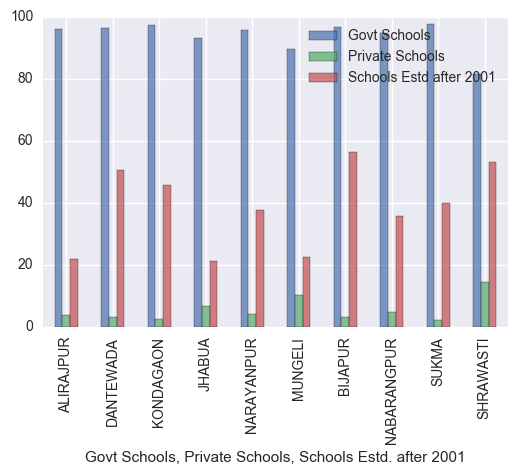

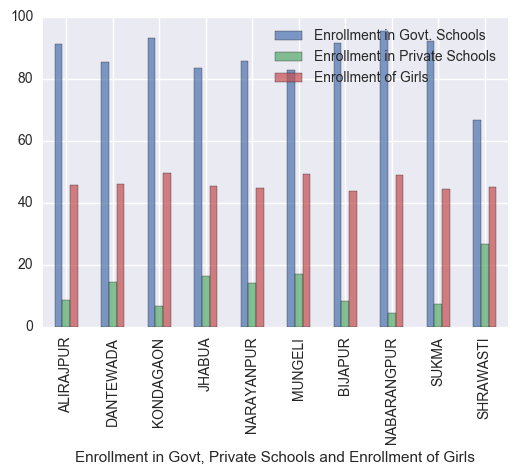

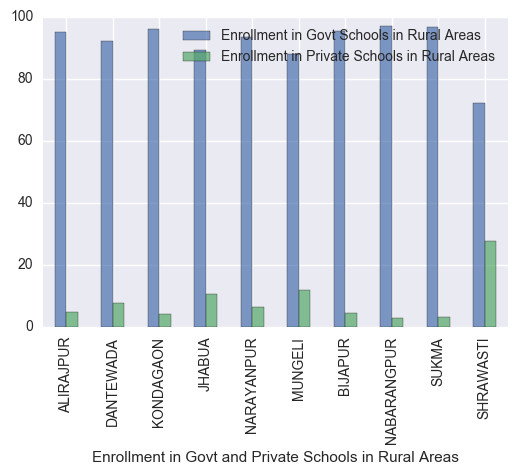

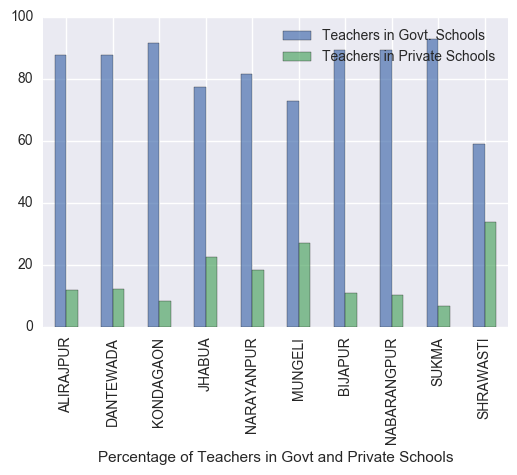

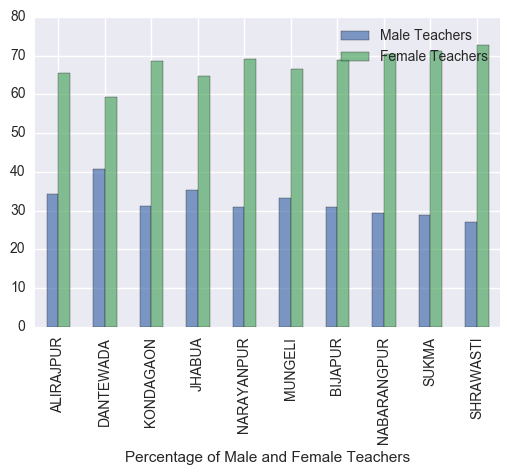

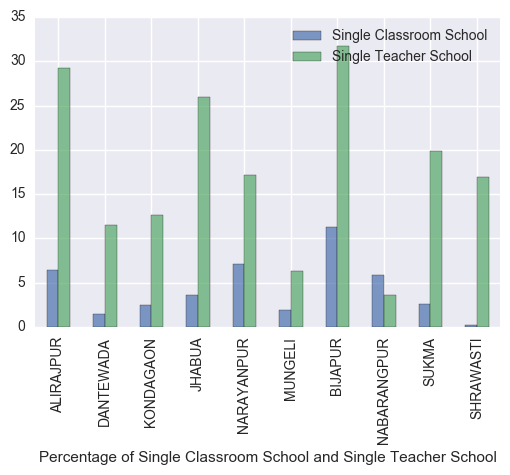

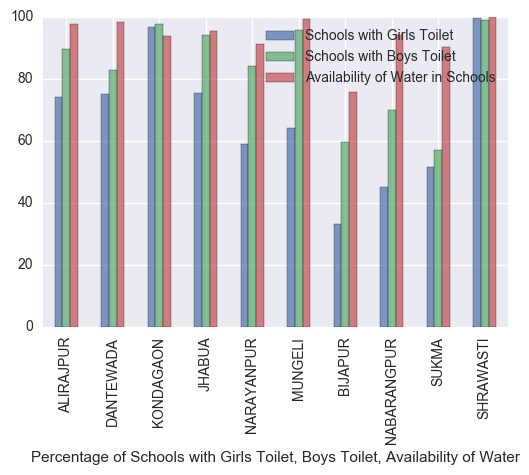

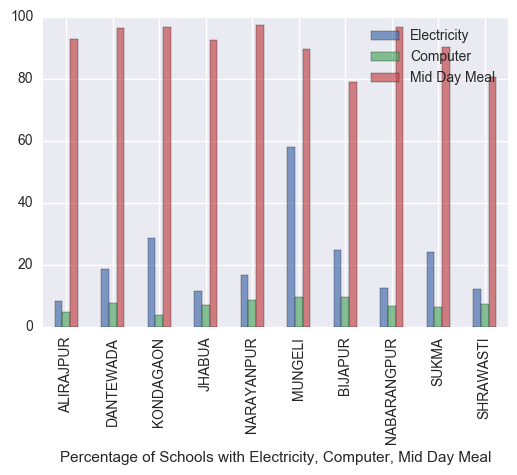

In [15]:
bottom_ten_district = p_school_district.sort_values(by="overall_li", ascending=True).set_index("distname").iloc[0:10]

visual(bottom_ten_district)

In [35]:
states_corrected = {}
s=1
for state in p_school_states.index.sort_values().tolist():
    states_corrected[state]=s
    s=s+1
print(states_corrected)

p_school_states["state"]=p_school_states.index

p_school_states["state_id"]=p_school_states["state"].map(states_corrected)

{'HARYANA': 13, 'TAMIL NADU': 31, 'KARNATAKA': 17, 'MANIPUR': 22, 'TRIPURA': 33, 'MADHYA PRADESH': 20, 'CHHATTISGARH': 7, 'GUJARAT': 12, 'ODISHA': 26, 'UTTAR PRADESH': 34, 'PUNJAB': 28, 'CHANDIGARH': 6, 'DELHI': 10, 'BIHAR': 5, 'ASSAM': 4, 'MEGHALAYA': 23, 'MIZORAM': 24, 'KERALA': 18, 'NAGALAND': 25, 'RAJASTHAN': 29, 'A & N ISLANDS': 1, 'JAMMU & KASHMIR': 15, 'DAMAN & DIU': 9, 'PUDUCHERRY': 27, 'DADRA & NAGAR HAVELI': 8, 'TELANGANA': 32, 'HIMACHAL PRADESH': 14, 'ANDHRA PRADESH': 2, 'WEST BENGAL': 36, 'UTTARAKHAND': 35, 'SIKKIM': 30, 'MAHARASHTRA': 21, 'ARUNACHAL PRADESH': 3, 'LAKSHADWEEP': 19, 'GOA': 11, 'JHARKHAND': 16}


In [17]:

#function to call for making a choropleth map for any column parameter
def choropleth(column):
    m = folium.Map(location=[22,77], zoom_start=4)
    m.choropleth(
        geo_str=open('india_states.geojson').read(),
        data=p_school_states,
        columns=['state_id', column],
        key_on='feature.properties.ID_1',
        fill_color='YlGn',
        fill_opacity=0.7,
        line_opacity=0.5
    )
    return m



     

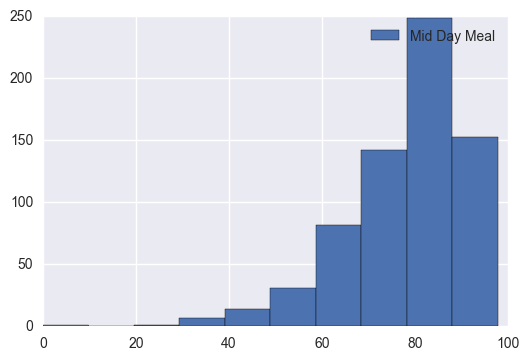

Mean value and Standard Deviation of Mid Day Meal Schools 77.90107969435408 12.839361740974365


C:\Users\epfo\Anaconda3\lib\site-packages\ipykernel\__main__.py:12: FutureWarning: 'threshold_scale' default behavior has changed. Now you get a linear scale between the 'min' and the 'max' of your data. To get former behavior, use folium.utilities.split_six.


In [18]:
p_school_district["p_mdmtot"].hist()
plt.legend(["Mid Day Meal"])
plt.show()
print("Mean value and Standard Deviation of Mid Day Meal Schools",p_school_district["p_mdmtot"].mean(),p_school_district["p_mdmtot"].std())
choropleth("p_mdmtot")

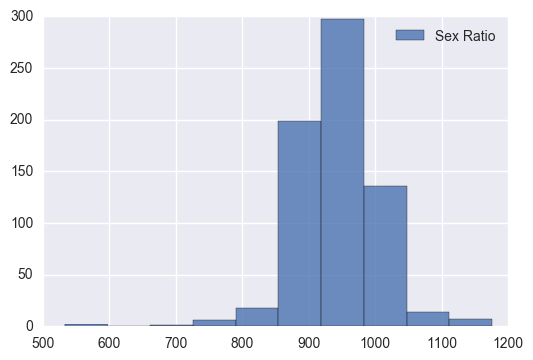

Mean value and Standard Deviation of Sex Ratio 943.3691176470588 61.76314688983323


In [36]:
p_school_district["sexratio"].hist(alpha=0.8)
plt.legend(["Sex Ratio"])
plt.show()
print("Mean value and Standard Deviation of Sex Ratio",p_school_district["sexratio"].mean(),p_school_district["sexratio"].std())
choropleth("sexratio")

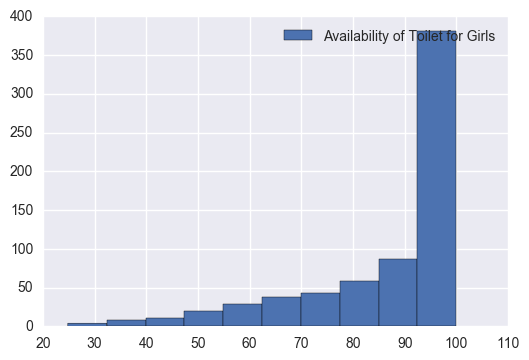

Mean value and Standard Deviation of Girls Toilet 87.00926390747914 16.106806952803005


In [37]:
p_school_district["p_sgtoiltot"].hist()
plt.legend(["Availability of Toilet for Girls"])
plt.show()
print("Mean value and Standard Deviation of Girls Toilet",p_school_district["p_sgtoiltot"].mean(),p_school_district["p_sgtoiltot"].std())
choropleth("p_sgtoiltot")

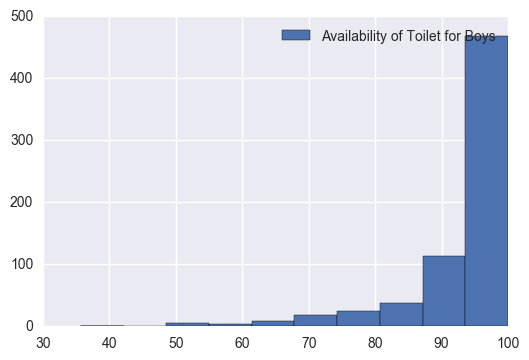

Mean value and Standard Deviation of Boys Toilet 93.16651992918234 8.961902410389872


In [38]:
p_school_district["p_sbtoiltot"].hist()
plt.legend(["Availability of Toilet for Boys"])
plt.show()
print("Mean value and Standard Deviation of Boys Toilet",p_school_district["p_sbtoiltot"].mean(),p_school_district["p_sbtoiltot"].std())
choropleth("p_sbtoiltot")

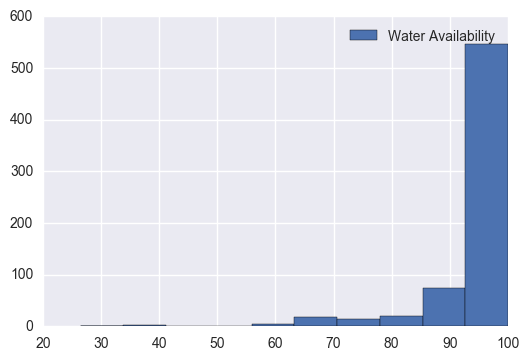

Mean value and Standard Deviation for Water Availability 95.0547799224891 8.98102488860597


In [39]:
p_school_district["p_swattot"].hist()
plt.legend(["Water Availability"])
plt.show()
print("Mean value and Standard Deviation for Water Availability",p_school_district["p_swattot"].mean(),p_school_district["p_swattot"].std())
choropleth("p_swattot")